In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

path = './data'

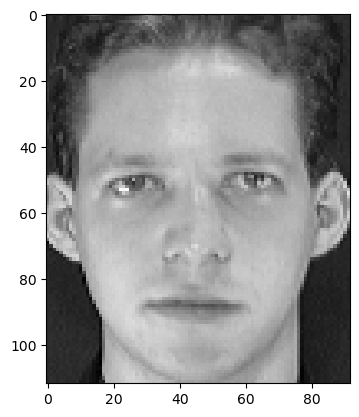

In [2]:
# for test, load a singe image
image = mpimg.imread(path + '/s11.pgm')
# convert image to 32 bit float
image = np.asarray(image, dtype = np.float32)
plt.imshow(image, cmap = 'gray')
plt.show()

In [3]:
num_row, num_col = image.shape

num_people = 40
num_images = 10

# Number of data
N = num_people * num_images

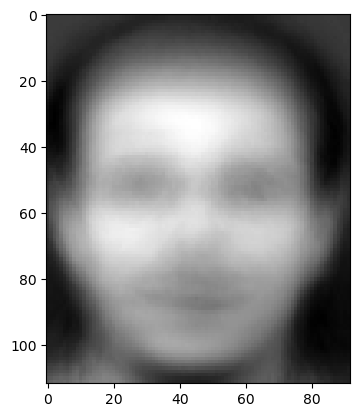

In [7]:
# read all images
X = []
for i in range(1, num_people +1):
    for j in range(1, num_images +1):
        file = '/s' + str(i) + str(j) + '.pgm'
        image = mpimg.imread(path + file)
        image = np.asarray(image, dtype = np.float32)
        #plt.imshow(image, cmap = 'gray')
        #plt.show()
        
        #Vectorization
        x = np.reshape(image, newshape = (num_row*num_col, 1), order = 'C')

        X.append(x)
        
# Make a data matrix of d x N
X = np.concatenate(X, axis=1)

# Compute a mean face 
mean = np.mean(X, axis=1, keepdims=True)

# Reshpae a mean vector to an image 
mean_face = np.reshape(mean, newshape=(num_row, num_col), order='C')
plt.imshow(mean_face, cmap='gray')
plt.show()

In [8]:
# Centering, zero-mean
X = X-mean

#check_mean should be a zero vector
check_mean = np.mean(X, axis = 1, keepdims = True)

#compute scatter matrix
S = np.matmul(X.T, X) / N

#Covariance Matrix
#C = np.matmul(X, X.T) / N

#V: Eigen-value, W: Eigen-vector
val, vec = np.linalg.eig(S)

#Remove negative values
pos = np.where(val > 0)
pos = np.squeeze(pos)
val = val[pos]
vec = vec[:, pos]

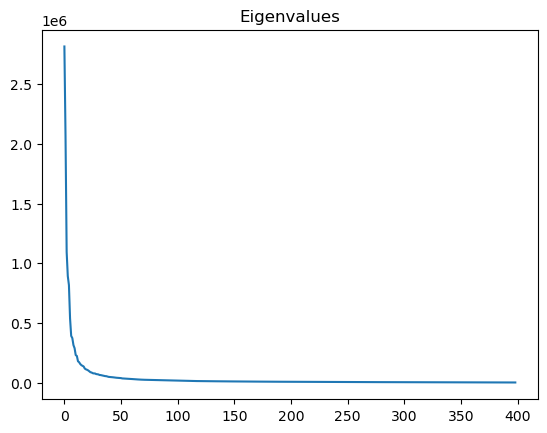

In [9]:
#Sort the eigenvalues in descending order
inx = np.argsort(val)[::-1]
V = val[inx]
A = vec[:, inx]

#Plot the eigenvalues in descending order
plt.plot(V)
plt.title('Eigenvalues')
plt.show()

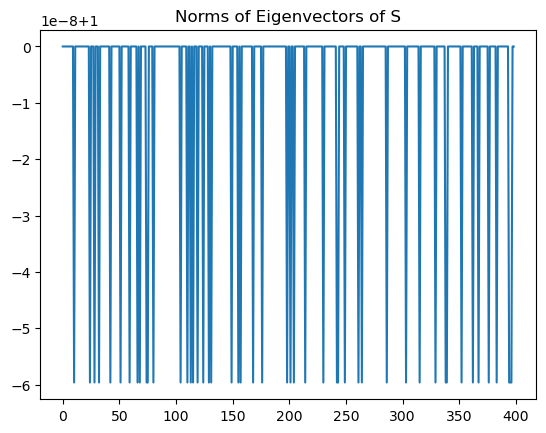

In [10]:
#Check the norm of A
norm_A = np.linalg.norm(A, ord = 2, axis = 0)
plt.plot(norm_A)
plt.title('Norms of Eigenvectors of S')
plt.show()

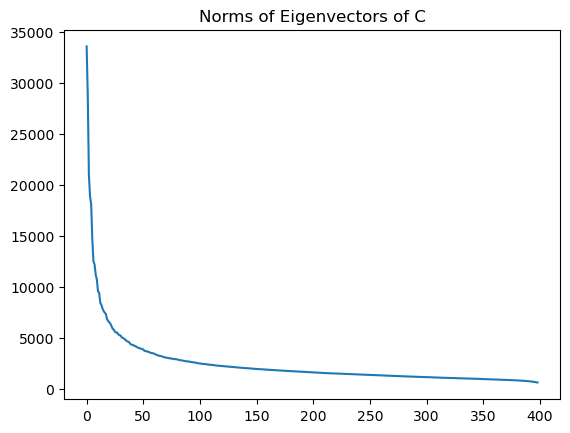

In [11]:
#Eigenvectors of the covariance matrix
E = np.matmul(X, A)

#Check the norm of W, the eigenvector of C
norm_E = np.linalg.norm(E, ord = 2, axis = 0)
plt.plot(norm_E)
plt.title('Norms of Eigenvectors of C')
plt.show()

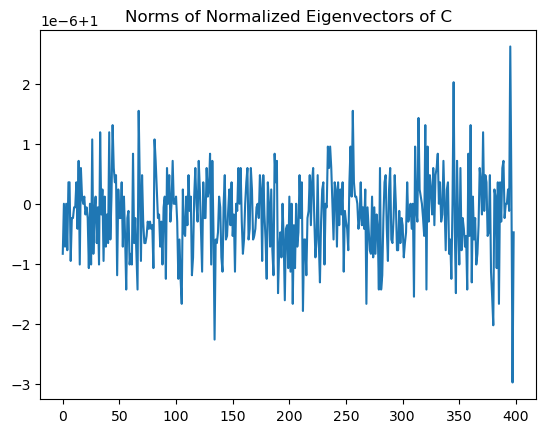

In [12]:
#Normalize W, the eigenvector of the covariance matrix
W = E / np.sqrt(N*V)
norm_W = np.linalg.norm(W, ord = 2, axis = 0)

#Plot the norm of the eigenvectors
plt.plot(norm_W)
plt.title('Norms of Normalized Eigenvectors of C')
plt.show()

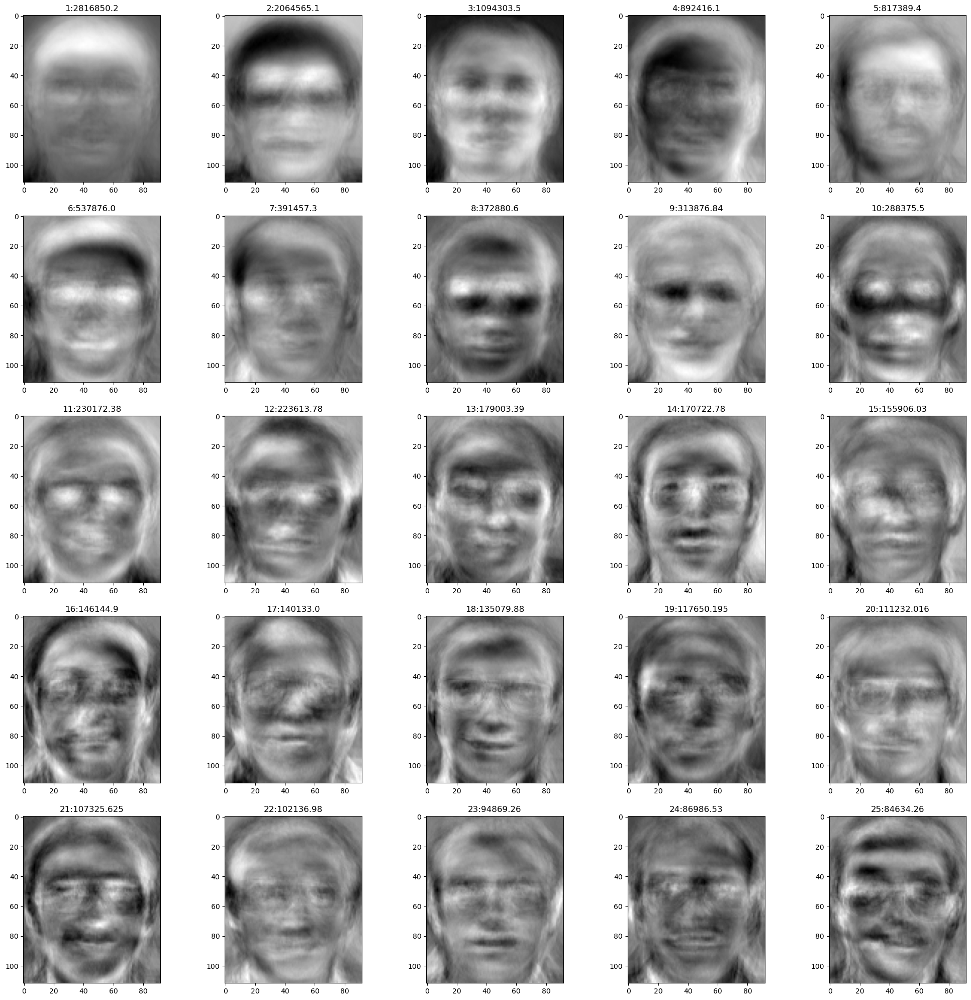

In [18]:
# Plot top 25 eigenfaces
plt.figure(figsize = (25,25))

plot_inx = 0
for i in range(5):
    for j in range(5):
        inx = i*5 +j
        w = W[:, inx]
        eigen_face = np.reshape(w, newshape = (num_row, num_col), order = 'C')
        plt.subplot(5, 5, inx+1)
        plt.imshow(eigen_face, cmap = 'gray')
        plt.title(str(inx+1) + ':' + str(V[inx]))
        
plt.show()

IndexError: index 399 is out of bounds for axis 1 with size 399

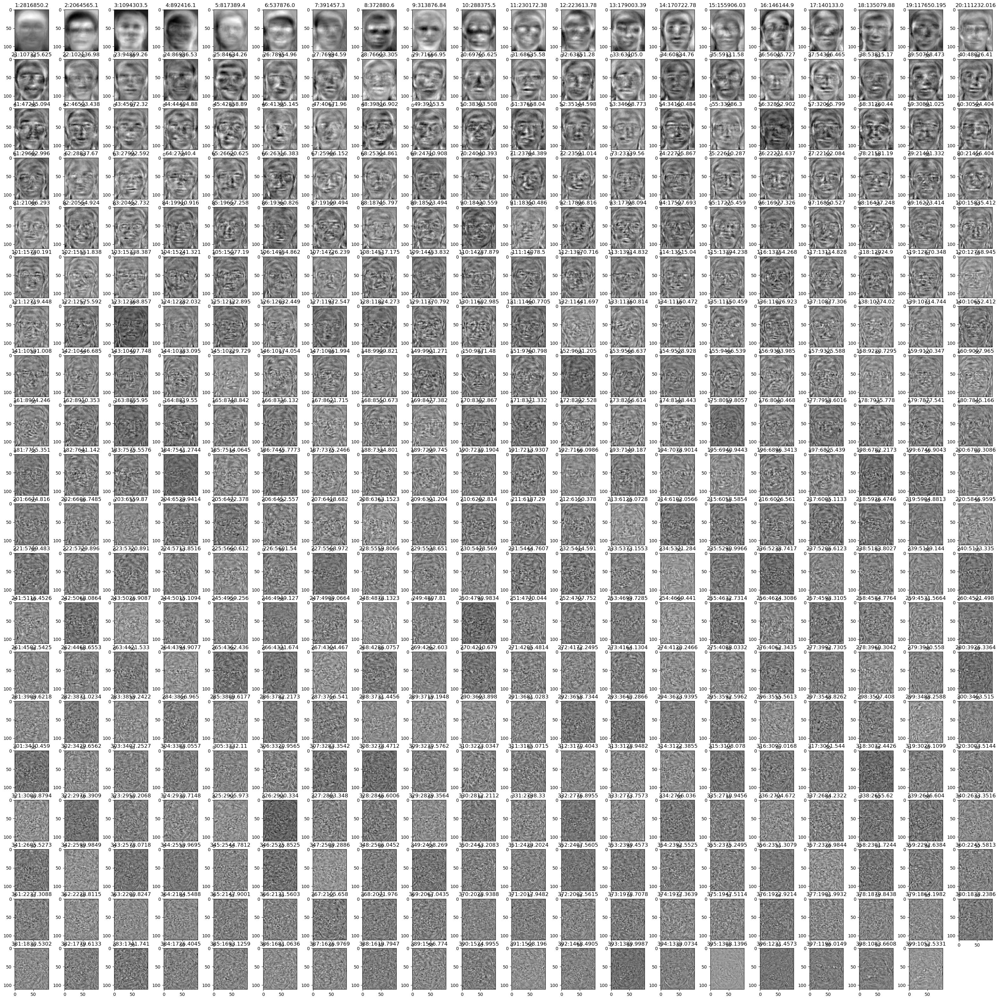

In [22]:
# Plot eigenfaces in the descending order of eigenvalues
plt.figure(figsize = (40,40))

plot_inx = 0
for i in range(20):
    for j in range(20):
        inx = i * 20 + j
        w = W[:, inx]
        eigen_face = np.reshape(w, newshape = (num_row, num_col), order = 'C')
        plt.subplot(20, 20, inx+1)
        plt.imshow(eigen_face, cmap = 'gray')
        plt.title(str(inx+1) + ':' + str(V[inx]))
        
plt.show()